In [1]:
import pyproj
import itertools
import numpy as np
import verde as vd
import harmonica as hm
import matplotlib.pyplot as plt
from sklearn.model_selection import ShuffleSplit

from eql_source_layouts import block_reduced_points

## Read magnetic anomaly data from Rio de Janeiro

In [2]:
# Fetch magnetic anomaly data from Rio de Janeiro
data = hm.datasets.fetch_rio_magnetic()

# Reduce region of the survey to speed things up
region = [-42.60, -42.40, -22.32, -22.20]
inside = vd.inside((data.longitude.values, data.latitude.values), region)
data = data[inside]

# Project coordinates
projection = pyproj.Proj(proj="merc", lat_ts=data.latitude.mean())
data["easting"], data["northing"] = projection(
    data.longitude.values, data.latitude.values
)
coordinates = (data["easting"], data["northing"], data.altitude_m)

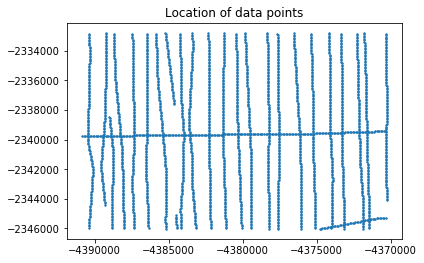

In [3]:
plt.scatter(*coordinates[:2], s=2)
plt.title("Location of data points")
plt.gca().set_aspect("equal")
plt.show()

## Generate a set of block reduced source points as an example

In [4]:
points = block_reduced_points(coordinates, spacing=1000)

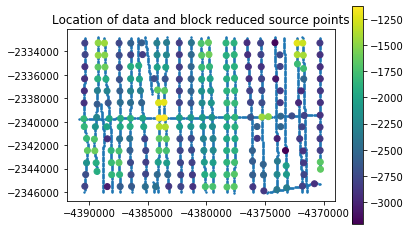

In [5]:
plt.scatter(*coordinates[:2], s=2)
tmp = plt.scatter(*points[:2], c=points[2])
plt.colorbar(tmp)
plt.title("Location of data and block reduced source points")
plt.gca().set_aspect("equal")
plt.show()

## Grid magnetic data

### Model selection

In [6]:
# Build combination of parameters
spacings = [250, 500, 1000, 1500, 2000]
k_nearests = [3, 5, 10]
depth_factors = [0.1, 0.5, 0.75, 1]
static_shifts = [0, -100, -200, -300, -400, -500, -600, -700, -800, -900, -1000]

# Use itertools to create a list with all combinations of parameters to test
parameter_sets = [
    dict(
        spacing=combo[0],
        k_nearest=combo[1],
        depth_factor=combo[2],
        static_shift=combo[3],
    )
    for combo in itertools.product(
        spacings, k_nearests, depth_factors, static_shifts
    )
]
print("Number of combinations:", len(parameter_sets))

Number of combinations: 660


In [7]:
scores = []
gridder = hm.EQLHarmonic()

for params in parameter_sets:
    points = block_reduced_points(coordinates, **params)
    gridder.set_params(points=points)
    shuffle = ShuffleSplit(n_splits=10, test_size=0.3, random_state=1)
    score = np.mean(
        vd.cross_val_score(
            gridder, coordinates, data.total_field_anomaly_nt, cv=shuffle
        )
    )
    scores.append(score)
scores = np.array(scores)

Scores: [-36.004868281663605, -6.074290411636666, -1.9532409057643527, 0.2925551471710402, 0.11899082686646131, -0.0748476283255652, 0.33848139762683244, 0.622862099574418, 0.7755070089033776, 0.88101927696408, 0.9263475157315717, -3.919034625977745, -1.1471377754995908, -0.0059703632678533404, -0.24409379398856199, -0.24303804589003325, 0.24370631532913656, 0.5884175927314502, 0.7817030259034984, 0.8979551620008858, 0.9618365717363873, 0.9695792097759153, -1.1832232052628224, -0.33763658913079253, -0.2871717255324297, -0.2988716075693034, 0.21129221427829056, 0.6187188902521416, 0.8248932478600608, 0.9189312520178696, 0.9586859988107914, 0.9655444818435607, 0.9571848252150217, -0.8206430462839627, -0.4441767135112416, -0.3104218125823353, 0.18216092060908035, 0.6273833939859672, 0.8416196610567452, 0.9252271860964632, 0.953663780532918, 0.9594294566822817, 0.9519761260850812, 0.9585932417964405, -15.007755489468105, -7.427355341266706, -1.209303654011703, 0.29724908998011096, -0.19459

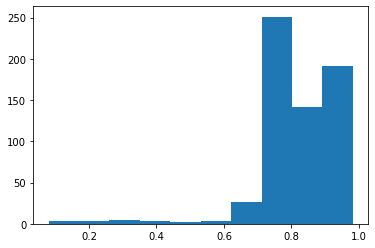

In [21]:
# Plot histogram of scores greater than 0
plt.hist(scores[scores > 0])
plt.show()

In [8]:
best = np.argmax(scores)
print("Best score:", scores[best])
print("Best parameters:", parameter_sets[best])

params = parameter_sets[best]
points = block_reduced_points(coordinates, **params)
gridder.set_params(points=points)
gridder.fit(coordinates, data.total_field_anomaly_nt)

Best score: 0.9824288830921677
Best parameters: {'spacing': 250, 'k_nearest': 5, 'depth_factor': 0.1, 'static_shift': -900}


EQLHarmonic(damping=None, depth_factor=3, k_nearest=1,
            points=(array([-4390405.71007111, -4388865.19061935, -4388040.25100793, ...,
       -4372274.92167398, -4371803.93253743, -4370330.25550936]),
                    array([-2345909.23402983, -2345947.23173733, -2345929.50683448, ...,
       -2332897.1918879 , -2332897.96661117, -2332895.4762451 ]),
                    array([-693.24212754, -827.07710456, -795.03578833, ..., -749.84430101,
       -800.32904883, -826.0317598 ])))

### Interpolate data into the regular grid at 200m above the sea level

In [9]:
region = vd.get_region(coordinates)
grid = gridder.grid(
    region=region, spacing=250, data_names=["magnetic_anomaly"], extra_coords=200
)

### Plot best result

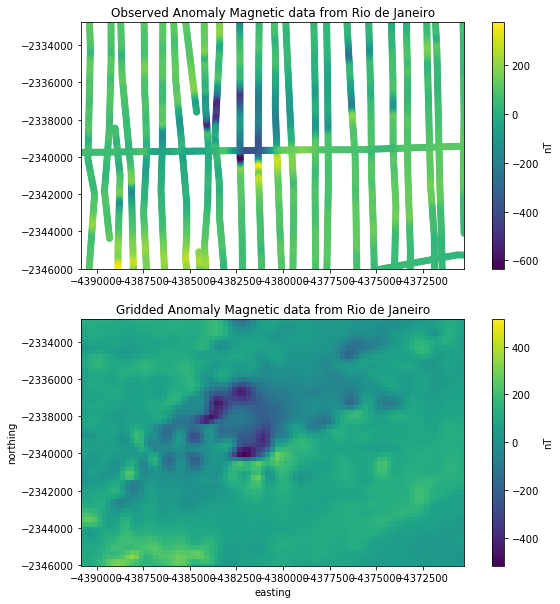

In [10]:
# Plot original magnetic anomaly
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))
tmp = ax1.scatter(data.easting, data.northing, c=data.total_field_anomaly_nt)
plt.colorbar(tmp, ax=ax1, label="nT")
ax1.set_xlim(*region[:2])
ax1.set_ylim(*region[2:])
ax1.set_aspect("equal")
ax1.set_title("Observed Anomaly Magnetic data from Rio de Janeiro")

# Plot gridded magnetic anomaly
tmp = grid.magnetic_anomaly.plot.pcolormesh(ax=ax2, add_colorbar=False, cmap="viridis")
plt.colorbar(tmp, ax=ax2, label="nT")
ax2.set_xlim(*region[:2])
ax2.set_ylim(*region[2:])
ax2.set_aspect("equal")
ax2.set_title("Gridded Anomaly Magnetic data from Rio de Janeiro")
plt.show()

## Plot all results

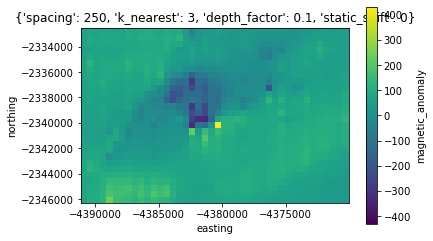

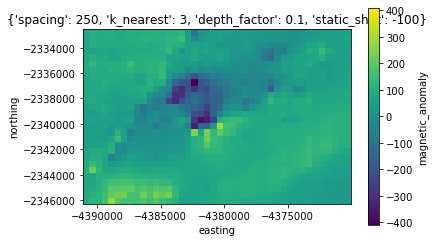

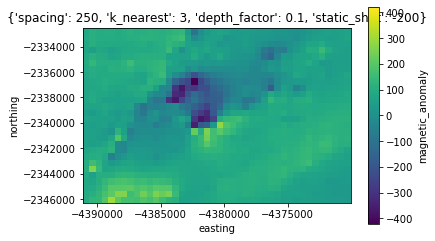

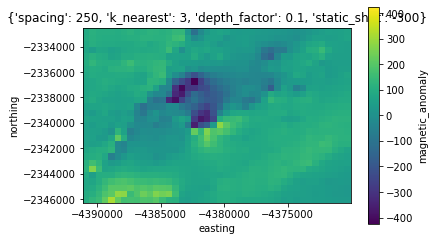

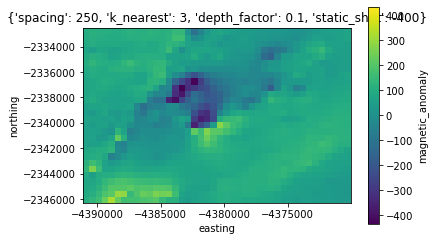

...

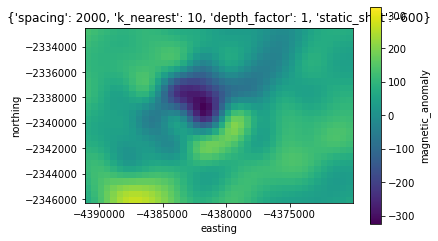

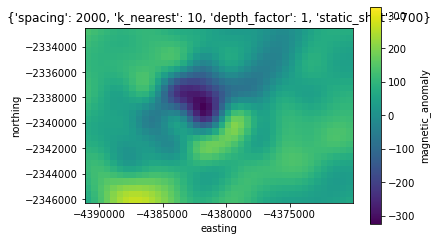

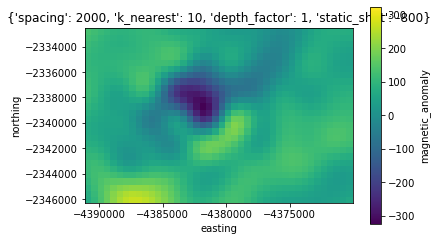

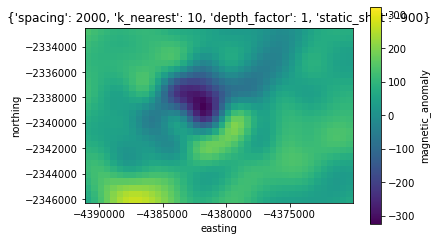

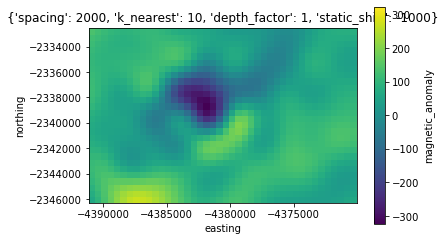

In [11]:
region = vd.get_region(coordinates)

for params in parameter_sets:
    points = block_reduced_points(coordinates, **params)
    gridder.set_params(points=points)
    gridder.fit(coordinates, data.total_field_anomaly_nt)
    grid = gridder.grid(
        region=region, spacing=500, data_names=["magnetic_anomaly"], extra_coords=200
    )

    tmp = grid.magnetic_anomaly.plot.pcolormesh(cmap="viridis")
    plt.gca().set_aspect("equal")
    plt.title(str(params))
    plt.show()